In [1]:
import os

STATIC_WEB_PAGE = {"EXECUTE_NB", "READTHEDOCS"}.intersection(os.environ)

```{autolink-concat}
```

::::{margin}
:::{card} Visualization of the second Riemann sheet with rotated branch cut 
TR-979
^^^
To reproduce the Riemann sheets shown in [Fig.&nbsp;50.1](https://pdg.lbl.gov/2023/reviews/rpp2023-rev-resonances.pdf#page=2) and [50.2](https://pdg.lbl.gov/2023/reviews/rpp2023-rev-resonances.pdf#page=4) of the PDG way to get from the first physical sheet to the second unphysical sheet is derived for the Amplitude calculated within the K matrix formalism.   
:::
::::

# Riemann sheets for two channels


In [2]:
%pip install -q ampform==0.14.8 plotly==5.17.0 sympy==1.12

Note: you may need to restart the kernel to use updated packages.


In [3]:
from __future__ import annotations

import warnings
from typing import Any

import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import sympy as sp
from ampform.io import aslatex
from ampform.sympy import unevaluated
from IPython.display import Math

warnings.filterwarnings("ignore")

## Rotated square root definition 
See report on Riemann sheets for one channel case [Link]

In [4]:
@unevaluated
class RotatedSqrt(sp.Expr):
    z: Any
    phi: Any
    _latex_repr_ = R"\sqrt[{phi}]{{{z}}}"

    def evaluate(self) -> sp.Expr:
        z, phi = self.args
        return sp.exp(-phi * sp.I / 2) * sp.sqrt(z * sp.exp(phi * sp.I))


z, phi = sp.symbols("z phi")
expr = RotatedSqrt(z, phi)
Math(aslatex({expr: expr.doit(deep=False)}))

<IPython.core.display.Math object>

In [5]:
@unevaluated(real=False)
class PhaseSpaceFactor_Rotated(sp.Expr):
    s: Any
    m1: Any
    m2: Any
    phi: Any
    _latex_repr_ = R"\rho^\phi_{{{m1}, {m2}}}\left({s}\right)"

    def evaluate(self) -> sp.Expr:
        s, m1, m2, phi = self.args
        return RotatedSqrt((s - ((m1 + m2) ** 2)) * (s - (m1 - m2) ** 2) / s**2, phi)


s, m1, m2, phi = sp.symbols("s m1 m2 phi")
rho_expr_rotated = PhaseSpaceFactor_Rotated(s, m1, m2, phi)
Math(aslatex({rho_expr_rotated: rho_expr_rotated.doit(deep=False)}))

<IPython.core.display.Math object>

In [6]:
@unevaluated(real=False)
class PhaseSpaceFactor(sp.Expr):
    s: Any
    m1: Any
    m2: Any
    _latex_repr_ = R"\rho_{{{m1}, {m2}}}\left({s}\right)"

    def evaluate(self) -> sp.Expr:
        s, m1, m2 = self.args
        return sp.sqrt((s - ((m1 + m2) ** 2)) * (s - (m1 - m2) ** 2) / s**2)


s, m1, m2 = sp.symbols("s m1 m2")
rho_expr = PhaseSpaceFactor(s, m1, m2)
Math(aslatex({rho_expr: rho_expr.doit(deep=False)}))

<IPython.core.display.Math object>

In [7]:
from ampform.kinematics.phasespace import Kallen


@unevaluated(real=False)
class PhaseSpaceFactor_Kaellen(sp.Expr):
    s: Any
    m1: Any
    m2: Any
    _latex_repr_ = R"\rho_{{{m1}, {m2}}}\left({s}\right)"

    def evaluate(self) -> sp.Expr:
        s, m1, m2 = self.args
        return 2 * BreakupMomentum(s, m1, m2) / sp.sqrt(s)


@unevaluated(real=False)
class PhaseSpaceCM(sp.Expr):
    s: Any
    m1: Any
    m2: Any
    _latex_repr_ = R"\rho^\mathrm{{CM}}_{{{m1},{m2}}}\left({s}\right)"

    def evaluate(self) -> sp.Expr:
        s, m1, m2 = self.args
        return -16 * sp.pi * sp.I * ChewMandelstam(s, m1, m2)


@unevaluated(real=False)
class ChewMandelstam(sp.Expr):
    s: Any
    m1: Any
    m2: Any
    _latex_repr_ = R"\Sigma\left({s}\right)"

    def evaluate(self) -> sp.Expr:
        s, m1, m2 = self.args
        q = BreakupMomentum(s, m1, m2)
        return (
            1
            / (16 * sp.pi**2)
            * (
                (2 * q / sp.sqrt(s))
                * sp.log((m1**2 + m2**2 - s + 2 * sp.sqrt(s) * q) / (2 * m1 * m2))
                - (m1**2 - m2**2) * (1 / s - 1 / (m1 + m2) ** 2) * sp.log(m1 / m2)
            )
        )


@unevaluated(real=False)
class BreakupMomentum(sp.Expr):
    s: Any
    m1: Any
    m2: Any
    _latex_repr_ = R"q\left({s}\right)"

    def evaluate(self) -> sp.Expr:
        s, m1, m2 = self.args
        return sp.sqrt(Kallen(s, m1**2, m2**2)) / (2 * sp.sqrt(s))


s, m1, m2 = sp.symbols("s m1 m2")
rho_expr_Kaellen = PhaseSpaceFactor_Kaellen(s, m1, m2)
rho_cm_expr = PhaseSpaceCM(s, m1, m2)
cm_expr = ChewMandelstam(s, m1, m2)
q_expr = BreakupMomentum(s, m1, m2)
kallen = Kallen(*sp.symbols("x:z"))
Math(
    aslatex({
        e: e.doit(deep=False)
        for e in [rho_expr_Kaellen, rho_cm_expr, cm_expr, q_expr, kallen]
    })
)

<IPython.core.display.Math object>

# T matrix definition with K matrix - 2 channel case 
In the following the dynamical part of the Amplitude is described within the K matrix formalism. Due to encirceling the the right hand branch cut of the phasespace factor by using the Chew Mandselstam function the Amplitude function of teh first sheet is described. The function is defined for positive real values and positive and negative imaginary values. 

## First Riemann sheet 

In [8]:
n_channels = 2
I = sp.Identity(n_channels)
K = sp.MatrixSymbol("K", n_channels, n_channels)

CM_symbol = sp.MatrixSymbol(R"{\rho_{\Sigma}}", n_channels, n_channels)
CM = sp.DiagonalMatrix(CM_symbol)
CM.as_explicit()

Matrix([
[{\rho_{\Sigma}}[0, 0],                     0],
[                    0, {\rho_{\Sigma}}[1, 1]]])

In [9]:
T_I = (I - sp.I * K * CM).inv() * K
T_I

(I - I*K*DiagonalMatrix({\rho_{\Sigma}}))**(-1)*K

In [10]:
T_I_explicit = T_I.as_explicit()
T_I_explicit

Matrix([
[(I*K[1, 1]*{\rho_{\Sigma}}[1, 1] - 1)*K[0, 0]/(K[0, 0]*K[1, 1]*{\rho_{\Sigma}}[0, 0]*{\rho_{\Sigma}}[1, 1] + I*K[0, 0]*{\rho_{\Sigma}}[0, 0] - K[0, 1]*K[1, 0]*{\rho_{\Sigma}}[0, 0]*{\rho_{\Sigma}}[1, 1] + I*K[1, 1]*{\rho_{\Sigma}}[1, 1] - 1) - I*K[0, 1]*K[1, 0]*{\rho_{\Sigma}}[1, 1]/(K[0, 0]*K[1, 1]*{\rho_{\Sigma}}[0, 0]*{\rho_{\Sigma}}[1, 1] + I*K[0, 0]*{\rho_{\Sigma}}[0, 0] - K[0, 1]*K[1, 0]*{\rho_{\Sigma}}[0, 0]*{\rho_{\Sigma}}[1, 1] + I*K[1, 1]*{\rho_{\Sigma}}[1, 1] - 1), (I*K[1, 1]*{\rho_{\Sigma}}[1, 1] - 1)*K[0, 1]/(K[0, 0]*K[1, 1]*{\rho_{\Sigma}}[0, 0]*{\rho_{\Sigma}}[1, 1] + I*K[0, 0]*{\rho_{\Sigma}}[0, 0] - K[0, 1]*K[1, 0]*{\rho_{\Sigma}}[0, 0]*{\rho_{\Sigma}}[1, 1] + I*K[1, 1]*{\rho_{\Sigma}}[1, 1] - 1) - I*K[0, 1]*K[1, 1]*{\rho_{\Sigma}}[1, 1]/(K[0, 0]*K[1, 1]*{\rho_{\Sigma}}[0, 0]*{\rho_{\Sigma}}[1, 1] + I*K[0, 0]*{\rho_{\Sigma}}[0, 0] - K[0, 1]*K[1, 0]*{\rho_{\Sigma}}[0, 0]*{\rho_{\Sigma}}[1, 1] + I*K[1, 1]*{\rho_{\Sigma}}[1, 1] - 1)],
[(I*K[0, 0]*{\rho_{\Sigma}}

In [11]:
CM_I_explicit = CM.as_explicit()

In [12]:
s = sp.Symbol("s")
ma1 = sp.Symbol("m_{a1}")
mb1 = sp.Symbol("m_{b1}")
ma2 = sp.Symbol("m_{a2}")
mb2 = sp.Symbol("m_{b2}")
m0 = sp.Symbol("m0")
w0 = sp.Symbol("Gamma0")
gamma1 = sp.Symbol("gamma1")
gamma2 = sp.Symbol("gamma2")
phi_rot = sp.Symbol("phi")
symbols = sp.Tuple(s, ma1, mb1, ma2, mb2, m0, w0, gamma1, gamma2)
symbols_rot = sp.Tuple(s, ma1, mb1, ma2, mb2, m0, w0, gamma1, gamma2, phi_rot)
k_expr_00 = (gamma1 * gamma1 * m0 * w0) / (s - m0**2)
k_expr_10 = (gamma1 * gamma2 * m0 * w0) / (s - m0**2)
k_expr_11 = (gamma2 * gamma2 * m0 * w0) / (s - m0**2)

In [13]:
cm_expressions = {
    K[0, 0]: k_expr_00,
    K[1, 1]: k_expr_11,
    K[0, 1]: k_expr_10,
    K[1, 0]: k_expr_10,
    CM[0, 0]: -PhaseSpaceCM(s, ma1, mb1),
    CM[1, 1]: -PhaseSpaceCM(s, ma2, mb2),
}

In [14]:
T_I_cm_expr_00 = T_I_explicit[0, 0].xreplace(cm_expressions)
T_I_cm_expr_11 = T_I_explicit[1, 1].xreplace(cm_expressions)
CM_I_expr_00 = CM_I_explicit[0, 0].xreplace(cm_expressions) + CM_I_explicit[
    1, 1
].xreplace(cm_expressions)

In [15]:
T_I_cm_expr_00.simplify(doit=False)

Gamma0*gamma1**2*m0/(I*Gamma0*gamma1**2*m0*PhaseSpaceCM(s, m_{a1}, m_{b1}) + I*Gamma0*gamma2**2*m0*PhaseSpaceCM(s, m_{a2}, m_{b2}) - m0**2 + s)

In [16]:
CM_I_expr_00.simplify(doit=False)

-PhaseSpaceCM(s, m_{a1}, m_{b1}) - PhaseSpaceCM(s, m_{a2}, m_{b2})

## Second, third and fourth Riemann sheet 

$$
A^{-1}_{II}(s)= A^{-1}_{I}(s)+2i\rho_{1}
$$

$$
A^{-1}_{III}(s)= A^{-1}_{II}(s)+2i\rho_{2}
$$

In [17]:
n_channels = 2
rho_symbol = sp.MatrixSymbol("rho", n_channels, n_channels)
rho = sp.DiagonalMatrix(rho_symbol)
rho.as_explicit()

Matrix([
[rho[0, 0],         0],
[        0, rho[1, 1]]])

In [18]:
T_II = (T_I.inv() + 2 * sp.I * rho).inv()
T_III = (T_I.inv() + 2 * sp.I * rho).inv()
T_IV = (-T_I.inv() - 2 * sp.I * rho).inv()

In [19]:
Rho_II = -CM - 2 * sp.I * rho
Rho_III = -CM - 2 * sp.I * rho
Rho_IV = +2 * sp.I * rho

In [20]:
T_II_explicit = T_II.as_explicit()
T_II_explicit

Matrix([
[(-2*I*K[0, 0]*K[1, 1]*rho[1, 1] + I*K[0, 0]*K[1, 1]*{\rho_{\Sigma}}[1, 1] - K[0, 0] + 2*I*K[0, 1]*K[1, 0]*rho[1, 1] - I*K[0, 1]*K[1, 0]*{\rho_{\Sigma}}[1, 1])/(4*K[0, 0]*K[1, 1]*rho[0, 0]*rho[1, 1] - 2*K[0, 0]*K[1, 1]*rho[0, 0]*{\rho_{\Sigma}}[1, 1] - 2*K[0, 0]*K[1, 1]*rho[1, 1]*{\rho_{\Sigma}}[0, 0] + K[0, 0]*K[1, 1]*{\rho_{\Sigma}}[0, 0]*{\rho_{\Sigma}}[1, 1] - 2*I*K[0, 0]*rho[0, 0] + I*K[0, 0]*{\rho_{\Sigma}}[0, 0] - 4*K[0, 1]*K[1, 0]*rho[0, 0]*rho[1, 1] + 2*K[0, 1]*K[1, 0]*rho[0, 0]*{\rho_{\Sigma}}[1, 1] + 2*K[0, 1]*K[1, 0]*rho[1, 1]*{\rho_{\Sigma}}[0, 0] - K[0, 1]*K[1, 0]*{\rho_{\Sigma}}[0, 0]*{\rho_{\Sigma}}[1, 1] - 2*I*K[1, 1]*rho[1, 1] + I*K[1, 1]*{\rho_{\Sigma}}[1, 1] - 1),                                                                                                                                                       -K[0, 1]/(4*K[0, 0]*K[1, 1]*rho[0, 0]*rho[1, 1] - 2*K[0, 0]*K[1, 1]*rho[0, 0]*{\rho_{\Sigma}}[1, 1] - 2*K[0, 0]*K[1, 1]*rho[1, 1]*{\rho_{\Sigma}}[0,

In [21]:
T_III_explicit = T_III.as_explicit()
T_III_explicit

Matrix([
[(-2*I*K[0, 0]*K[1, 1]*rho[1, 1] + I*K[0, 0]*K[1, 1]*{\rho_{\Sigma}}[1, 1] - K[0, 0] + 2*I*K[0, 1]*K[1, 0]*rho[1, 1] - I*K[0, 1]*K[1, 0]*{\rho_{\Sigma}}[1, 1])/(4*K[0, 0]*K[1, 1]*rho[0, 0]*rho[1, 1] - 2*K[0, 0]*K[1, 1]*rho[0, 0]*{\rho_{\Sigma}}[1, 1] - 2*K[0, 0]*K[1, 1]*rho[1, 1]*{\rho_{\Sigma}}[0, 0] + K[0, 0]*K[1, 1]*{\rho_{\Sigma}}[0, 0]*{\rho_{\Sigma}}[1, 1] - 2*I*K[0, 0]*rho[0, 0] + I*K[0, 0]*{\rho_{\Sigma}}[0, 0] - 4*K[0, 1]*K[1, 0]*rho[0, 0]*rho[1, 1] + 2*K[0, 1]*K[1, 0]*rho[0, 0]*{\rho_{\Sigma}}[1, 1] + 2*K[0, 1]*K[1, 0]*rho[1, 1]*{\rho_{\Sigma}}[0, 0] - K[0, 1]*K[1, 0]*{\rho_{\Sigma}}[0, 0]*{\rho_{\Sigma}}[1, 1] - 2*I*K[1, 1]*rho[1, 1] + I*K[1, 1]*{\rho_{\Sigma}}[1, 1] - 1),                                                                                                                                                       -K[0, 1]/(4*K[0, 0]*K[1, 1]*rho[0, 0]*rho[1, 1] - 2*K[0, 0]*K[1, 1]*rho[0, 0]*{\rho_{\Sigma}}[1, 1] - 2*K[0, 0]*K[1, 1]*rho[1, 1]*{\rho_{\Sigma}}[0,

In [22]:
T_IV_explicit = T_IV.as_explicit()
T_IV_explicit

Matrix([
[(2*I*K[0, 0]*K[1, 1]*rho[1, 1] - I*K[0, 0]*K[1, 1]*{\rho_{\Sigma}}[1, 1] + K[0, 0] - 2*I*K[0, 1]*K[1, 0]*rho[1, 1] + I*K[0, 1]*K[1, 0]*{\rho_{\Sigma}}[1, 1])/(4*K[0, 0]*K[1, 1]*rho[0, 0]*rho[1, 1] - 2*K[0, 0]*K[1, 1]*rho[0, 0]*{\rho_{\Sigma}}[1, 1] - 2*K[0, 0]*K[1, 1]*rho[1, 1]*{\rho_{\Sigma}}[0, 0] + K[0, 0]*K[1, 1]*{\rho_{\Sigma}}[0, 0]*{\rho_{\Sigma}}[1, 1] - 2*I*K[0, 0]*rho[0, 0] + I*K[0, 0]*{\rho_{\Sigma}}[0, 0] - 4*K[0, 1]*K[1, 0]*rho[0, 0]*rho[1, 1] + 2*K[0, 1]*K[1, 0]*rho[0, 0]*{\rho_{\Sigma}}[1, 1] + 2*K[0, 1]*K[1, 0]*rho[1, 1]*{\rho_{\Sigma}}[0, 0] - K[0, 1]*K[1, 0]*{\rho_{\Sigma}}[0, 0]*{\rho_{\Sigma}}[1, 1] - 2*I*K[1, 1]*rho[1, 1] + I*K[1, 1]*{\rho_{\Sigma}}[1, 1] - 1),                                                                                                                                                       K[0, 1]/(4*K[0, 0]*K[1, 1]*rho[0, 0]*rho[1, 1] - 2*K[0, 0]*K[1, 1]*rho[0, 0]*{\rho_{\Sigma}}[1, 1] - 2*K[0, 0]*K[1, 1]*rho[1, 1]*{\rho_{\Sigma}}[0, 0

In [23]:
Rho_II_explicit = Rho_II.as_explicit()
Rho_II_explicit

Matrix([
[-2*I*rho[0, 0] - {\rho_{\Sigma}}[0, 0],                                      0],
[                                     0, -2*I*rho[1, 1] - {\rho_{\Sigma}}[1, 1]]])

In [24]:
Rho_III_explicit = Rho_III.as_explicit()
Rho_III_explicit

Matrix([
[-2*I*rho[0, 0] - {\rho_{\Sigma}}[0, 0],                                      0],
[                                     0, -2*I*rho[1, 1] - {\rho_{\Sigma}}[1, 1]]])

In [25]:
Rho_IV_explicit = Rho_IV.as_explicit()
Rho_IV_explicit

Matrix([
[2*I*rho[0, 0],             0],
[            0, 2*I*rho[1, 1]]])

In [26]:
rho_expressions_II = {
    **cm_expressions,
    rho[0, 0]: PhaseSpaceFactor(s, ma1, mb1),
    rho[1, 1]: 0,
}

rho_expressions_III = {
    **cm_expressions,
    rho[0, 0]: PhaseSpaceFactor(s, ma1, mb1),
    rho[1, 1]: PhaseSpaceFactor(s, ma2, mb2),
}


rho_expressions_IV = {
    **cm_expressions,
    rho[0, 0]: 0,
    rho[1, 1]: PhaseSpaceFactor(s, ma2, mb2),
}

In [27]:
rho_expressions_rotated = {
    **cm_expressions,
    rho[0, 0]: PhaseSpaceFactor_Rotated(s, ma1, mb1, phi),
    rho[1, 1]: PhaseSpaceFactor(s, ma2, mb2),
}

In [28]:
T_II_rho_expr_00 = T_II_explicit[0, 0].xreplace(rho_expressions_II)
T_III_rho_expr_00 = T_III_explicit[0, 0].xreplace(rho_expressions_III)
T_IV_rho_expr_00 = T_IV_explicit[0, 0].xreplace(rho_expressions_IV)
T_II_rho_expr_rotated_00 = T_II_explicit[0, 0].xreplace(rho_expressions_rotated)

In [29]:
Rho_II_expr_00 = Rho_II_explicit[0, 0].xreplace(rho_expressions_II)
Rho_III_expr_00 = Rho_III_explicit[0, 0].xreplace(
    rho_expressions_III
) + Rho_III_explicit[1, 1].xreplace(rho_expressions_III)
Rho_IV_expr_00 = -Rho_III_expr_00 + Rho_IV_explicit[1, 1].xreplace(
    rho_expressions_IV
)
# + Rho_IV_explicit[1, 1].xreplace(rho_expressions_IV)

In [30]:
T_II_rho_expr_00.simplify(doit=False)

Gamma0*gamma1**2*m0/(I*Gamma0*gamma1**2*m0*PhaseSpaceCM(s, m_{a1}, m_{b1}) + 2*I*Gamma0*gamma1**2*m0*PhaseSpaceFactor(s, m_{a1}, m_{b1}) + I*Gamma0*gamma2**2*m0*PhaseSpaceCM(s, m_{a2}, m_{b2}) - m0**2 + s)

In [31]:
T_III_rho_expr_00.simplify(doit=False)

Gamma0*gamma1**2*m0/(I*Gamma0*gamma1**2*m0*PhaseSpaceCM(s, m_{a1}, m_{b1}) + 2*I*Gamma0*gamma1**2*m0*PhaseSpaceFactor(s, m_{a1}, m_{b1}) + I*Gamma0*gamma2**2*m0*PhaseSpaceCM(s, m_{a2}, m_{b2}) + 2*I*Gamma0*gamma2**2*m0*PhaseSpaceFactor(s, m_{a2}, m_{b2}) - m0**2 + s)

In [32]:
Rho_II_expr_00.simplify(doit=False)

PhaseSpaceCM(s, m_{a1}, m_{b1}) - 2*I*PhaseSpaceFactor(s, m_{a1}, m_{b1})

In [33]:
Rho_IV_expr_00.simplify(doit=False)

-PhaseSpaceCM(s, m_{a1}, m_{b1}) - PhaseSpaceCM(s, m_{a2}, m_{b2}) + 2*I*PhaseSpaceFactor(s, m_{a1}, m_{b1}) + 4*I*PhaseSpaceFactor(s, m_{a2}, m_{b2})

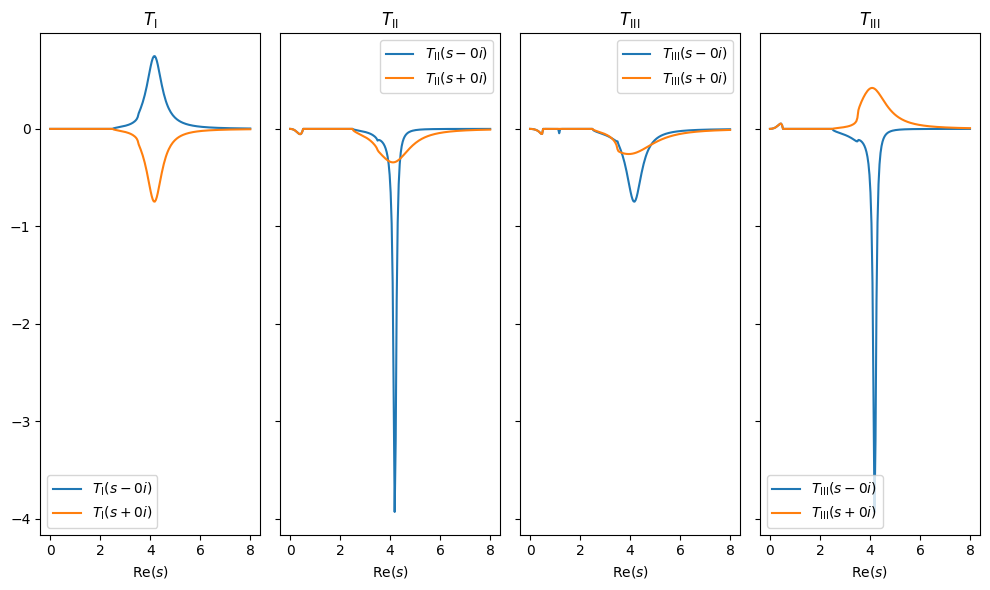

In [34]:
T_I_func = sp.lambdify(symbols, T_I_cm_expr_00.doit())
T_II_func = sp.lambdify(symbols, T_II_rho_expr_00.doit())
T_III_func = sp.lambdify(symbols, T_III_rho_expr_00.doit())
T_IV_func = sp.lambdify(symbols, T_IV_rho_expr_00.doit())
values = {
    ma1: 1.0,
    mb1: 1.5,
    ma2: 1.5,
    mb2: 2.0,
    m0: 4.0,
    w0: 0.5,
    gamma1: 1,
    gamma2: 1,
}

args = eval(str(symbols[1:].xreplace(values)))

epsilon = 1e-5
x = np.linspace(0, 8, num=200)
y = np.linspace(epsilon, 1, num=100)
X, Y = np.meshgrid(x, y)
Zn = X - Y * 1j
Zp = X + Y * 1j

T1n = T_I_func(Zn**2, *args)
T1p = T_I_func(Zp**2, *args)

T2n = T_II_func(Zn**2, *args)
T2p = T_II_func(Zp**2, *args)

T3n = T_III_func(Zn**2, *args)
T3p = T_III_func(Zp**2, *args)

T4n = T_IV_func(Zn**2, *args)
T4p = T_IV_func(Zp**2, *args)

fig, axes = plt.subplots(figsize=(10, 6), ncols=4, sharey=True)
ax1, ax2, ax3, ax4 = axes
for ax in axes:
    ax.set_xlabel(R"$\mathrm{Re}(s)$")

ax1.plot(x, T1n[0].imag, label=R"$T_\mathrm{I}(s-0i)$")
ax1.plot(x, T1p[0].imag, label=R"$T_\mathrm{I}(s+0i)$")
ax1.set_title(f"${sp.latex(rho_cm_expr)}$")
ax1.set_title(R"$T_\mathrm{I}$")

ax2.plot(x, T2n[0].imag, label=R"$T_\mathrm{II}(s-0i)$")
ax2.plot(x, T2p[0].imag, label=R"$T_\mathrm{II}(s+0i)$")
ax2.set_title(R"$T_\mathrm{II}$")

ax3.plot(x, T3n[0].imag, label=R"$T_\mathrm{III}(s-0i)$")
ax3.plot(x, T3p[0].imag, label=R"$T_\mathrm{III}(s+0i)$")
ax3.set_title(R"$T_\mathrm{III}$")

ax4.plot(x, T4n[0].imag, label=R"$T_\mathrm{III}(s-0i)$")
ax4.plot(x, T4p[0].imag, label=R"$T_\mathrm{III}(s+0i)$")
ax4.set_title(R"$T_\mathrm{III}$")

for ax in axes:
    ax.legend()

fig.tight_layout()
plt.show()

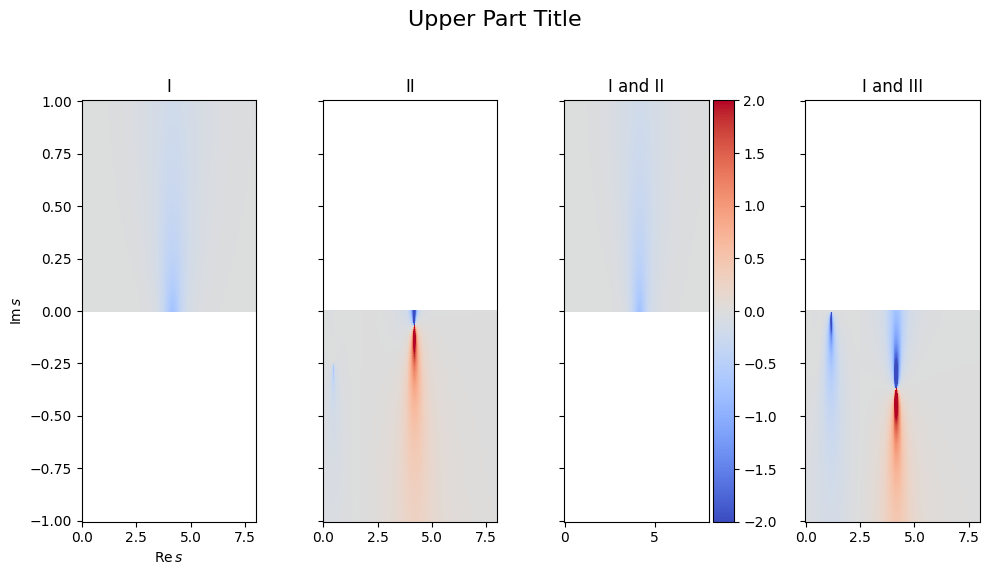

In [35]:
%config InlineBackend.figure_formats = ["png"]

fig, axes_2 = plt.subplots(figsize=(10, 6), ncols=4, sharey=True)
ax3, ax4, ax5, ax6 = axes_2


ax3.set_xlabel(R"$\mathrm{Re}\,s$")
ax3.set_ylabel(R"$\mathrm{Im}\,s$")


ax3.set_title("I")
ax4.set_title("II")
ax5.set_title("I and II")
ax6.set_title("I and III")

T_max = 2

mesh1 = ax3.pcolormesh(
    X, Y, T1p.imag, vmin=-T_max, vmax=+T_max, cmap=plt.cm.coolwarm
)
mesh2 = ax4.pcolormesh(
    X, -Y, T2n.imag, vmin=-T_max, vmax=+T_max, cmap=plt.cm.coolwarm
)
mesh3 = ax5.pcolormesh(
    X, Y, T1p.imag, vmin=-T_max, vmax=+T_max, cmap=plt.cm.coolwarm
)
mesh4 = ax6.pcolormesh(
    X, -Y, T3n.imag, vmin=-T_max, vmax=+T_max, cmap=plt.cm.coolwarm
)

plt.colorbar(mesh1, ax=ax5, pad=0.02)

fig.suptitle("Upper Part Title", fontsize=16)

fig.tight_layout(rect=[0, 0.03, 1, 0.95])

# Display the plot
plt.show()

## Investigation on rotation the branch cut of the second sheet 

In [36]:
def sty(sheet_name: str) -> dict:
    sheet_color = sheet_colors[sheet_name]
    n_lines = 16
    return dict(
        cmin=-vmax,
        cmax=+vmax,
        colorscale=[[0, "rgb(0, 0, 0)"], [1, sheet_color]],
        contours=dict(
            x=dict(
                show=True,
                start=x.min(),
                end=x.max(),
                size=(x.max() - x.min()) / n_lines,
                color="black",
            ),
            y=dict(
                show=True,
                start=-y.max(),
                end=+y.max(),
                size=(y.max() - y.min()) / (n_lines // 2),
                color="black",
            ),
        ),
        name=sheet_name,
        opacity=0.4,
        showscale=False,
    )


vmax = 3
project = np.imag
sheet_colors = {
    "Physical (T1)": "blue",
    "Unphysical (T2)": "red",
    "Unphysical (T3)": "green",
    "Unphysical (T4)": "yellow",
}

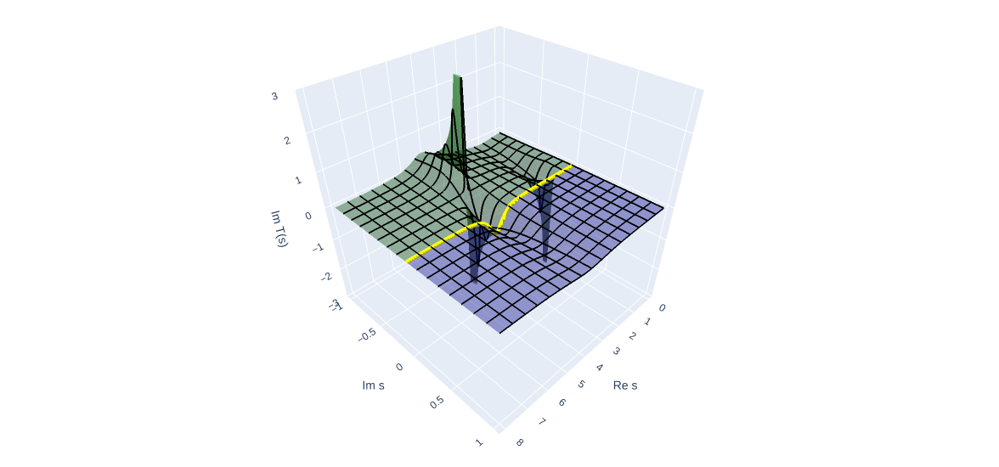

In [37]:
Sn = go.Surface(x=X, y=-Y, z=T2n.imag, **sty("Unphysical (T2)"))
Sn_III = go.Surface(x=X, y=-Y, z=T3n.imag, **sty("Unphysical (T3)"))
Sp = go.Surface(x=X, y=+Y, z=T1p.imag, **sty("Physical (T1)"))
zeros = np.zeros(x.shape)
lineshape = go.Scatter3d(
    x=x,
    y=zeros,
    z=project(T1p[0]),
    line=dict(color="yellow", width=10),
    mode="lines",
    name="Lineshape",
)

fig = go.Figure(data=[Sn_III, Sp, lineshape])
fig.update_layout(
    height=550,
    width=600,
    margin=dict(l=0, r=0, t=30, b=0),
    showlegend=False,
    # title_text="Im(T) with Chew-Mandelstam phase space factor",
)
fig.update_scenes(
    camera_center=dict(z=-0.2),
    xaxis_title_text="Re s",
    yaxis_title_text="Im s",
    zaxis_title_text="Im T(s)",
    zaxis_range=[-vmax, +vmax],
)

fig.show()

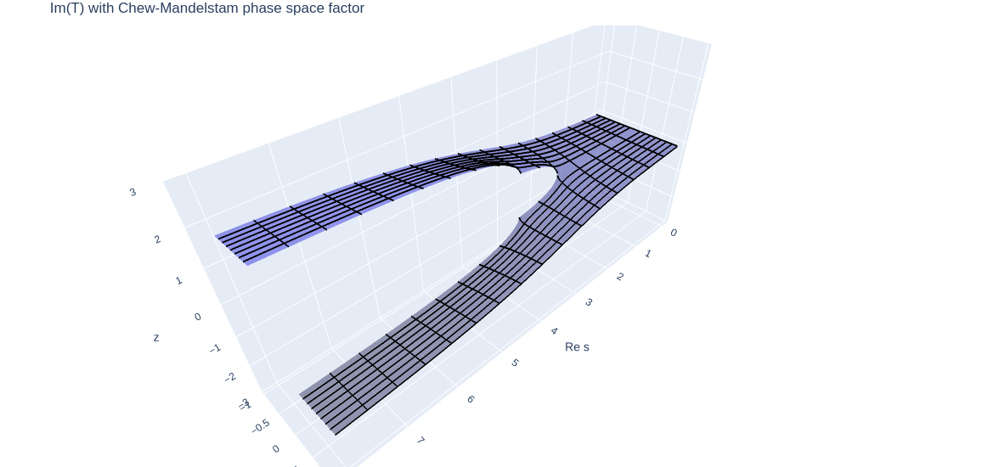

In [38]:
CM_I_func = sp.lambdify(symbols, CM_I_expr_00.doit())
Rho_II_func = sp.lambdify(symbols, Rho_II_expr_00.doit())
Rho_III_func = sp.lambdify(symbols, Rho_III_expr_00.doit())
Rho_IV_func = sp.lambdify(symbols, Rho_IV_expr_00.doit())


Rho1n = CM_I_func(Zn**2, *args)
Rho1p = CM_I_func(Zp**2, *args)

Rho2n = Rho_II_func(Zn**2, *args)
Rho2p = Rho_II_func(Zp**2, *args)

Rho3n = Rho_III_func(Zn**2, *args)
Rho3p = Rho_III_func(Zp**2, *args)

Rho4n = Rho_IV_func(Zn**2, *args)
Rho4p = Rho_IV_func(Zp**2, *args)


S2 = go.Surface(x=X, y=-Y, z=Rho2n.real, **sty("Unphysical (T2)"))
S3 = go.Surface(x=X, y=-Y, z=Rho3n.real, **sty("Unphysical (T3)"))
S4 = go.Surface(x=X, y=-Y, z=Rho4n.real, **sty("Unphysical (T4)"))
S1_p = go.Surface(x=X, y=Y, z=Rho1p.real, **sty("Physical (T1)"))
S1_n = go.Surface(x=X, y=-Y, z=Rho1n.real, **sty("Physical (T1)"))
zeros = np.zeros(x.shape)


fig = go.Figure(data=[S1_p, S1_n])
fig.update_layout(
    height=550,
    margin=dict(l=0, r=0, t=30, b=0),
    showlegend=False,
    title_text="Im(T) with Chew-Mandelstam phase space factor",
)
fig.update_scenes(
    camera_center=dict(z=-0.2),
    xaxis_title_text="Re s",
    yaxis_title_text="Im s",
    zaxis_range=[-vmax, +vmax],
)

fig.show()